# Customer Segmentation of Online Retail Customers
# Gillian Tatreau

In [1]:
# install wordcloud library
# !pip install wordcloud

### Load libraries

In [2]:
# load libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.datasets import make_blobs
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import plotly.express as px
import plotly.graph_objects as go
from os import path
from PIL import Image
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

### Load and prep data

In [3]:
# load data
df = pd.read_csv("/Users/gillian/Documents/Bellevue Grad Program/Winter 2023-24/Project 2/online_retail.csv")
# display first 5 rows
df.head()

,index,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
0,0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,12/1/2010 8:26,2.55,17850.0,United Kingdom
1,1,536365,71053,WHITE METAL LANTERN,6,12/1/2010 8:26,3.39,17850.0,United Kingdom
2,2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,12/1/2010 8:26,2.75,17850.0,United Kingdom
3,3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,12/1/2010 8:26,3.39,17850.0,United Kingdom
4,4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,12/1/2010 8:26,3.39,17850.0,United Kingdom


In [4]:
# remove index column
df = df.drop(columns = "index")

In [5]:
# data types of columns
df.dtypes

InvoiceNo       object
StockCode       object
Description     object
Quantity         int64
InvoiceDate     object
UnitPrice      float64
CustomerID     float64
Country         object
dtype: object

In [6]:
# convert InvoiceDate to datetime
df['InvoiceDate'] = pd.to_datetime(df['InvoiceDate'])

In [7]:
# stats of numeric columns
df.describe()

,Quantity,UnitPrice,CustomerID
count,541909.000000,541909.000000,406829.000000
mean,9.552250,4.611114,15287.690570
std,218.081158,96.759853,1713.600303
min,-80995.000000,-11062.060000,12346.000000
25%,1.000000,1.250000,13953.000000
50%,3.000000,2.080000,15152.000000
75%,10.000000,4.130000,16791.000000
max,80995.000000,38970.000000,18287.000000


In [8]:
# number of non-null values and datatypes after converting InvoiceDate
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 541909 entries, 0 to 541908
Data columns (total 8 columns):
 #   Column       Non-Null Count   Dtype         
---  ------       --------------   -----         
 0   InvoiceNo    541909 non-null  object        
 1   StockCode    541909 non-null  object        
 2   Description  540455 non-null  object        
 3   Quantity     541909 non-null  int64         
 4   InvoiceDate  541909 non-null  datetime64[ns]
 5   UnitPrice    541909 non-null  float64       
 6   CustomerID   406829 non-null  float64       
 7   Country      541909 non-null  object        
dtypes: datetime64[ns](1), float64(2), int64(1), object(4)
memory usage: 33.1+ MB


In [9]:
# remove rows with missing data
df = df.dropna()

Removes 135,080 rows due to NAs, but still leaves 406,829 rows of viable data. 

### EDA

#### Outliers

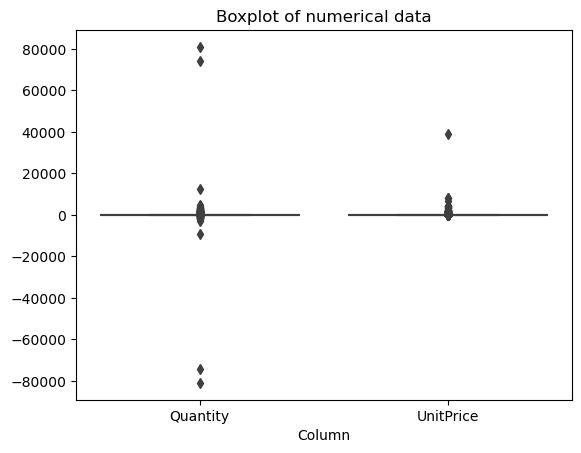

In [10]:
# plot boxplot of Quantity and UnitPrice
sns.boxplot(data = df[['Quantity', 'UnitPrice']])
plt.xlabel("Column")
plt.title("Boxplot of numerical data")
# plt.savefig("boxplot_woutliers.png")
plt.show()

In [11]:
# removing rows where Quantity is negative or greater than 1000
df1 = df[df['Quantity'] > 0]
df1 = df1[df1["Quantity"] < 1000]
# removing rows where UnitPrice > 500 or negative
df1 = df1[df1['UnitPrice'] > 0] 
df1 = df1[df1['UnitPrice'] < 500]

Removes 9101 rows. Keeps some outliers but removes the most egregious. Removes negative values seen in Quantity in boxplot above (negative number could be due to returns). 

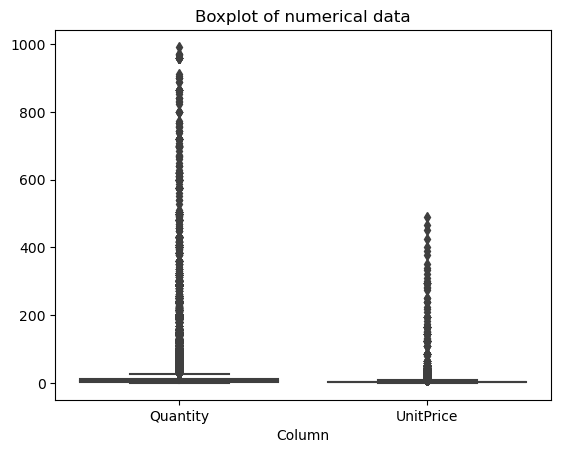

In [12]:
# boxplot of Quantity and UnitPrice after removing visible outliers
sns.boxplot(data = df1[['Quantity', 'UnitPrice']])
plt.xlabel("Column")
plt.title("Boxplot of numerical data")
# plt.savefig("boxplot_wless_outliers.png")
plt.show()

#### Averages by Unique Customer

In [13]:
# number of unique StockCode
df1['StockCode'].nunique()

3663

In [14]:
# number of unique customers
df1['CustomerID'].nunique()

4329

In [15]:
# average number of transactions per customer
df1['CustomerID'].count()/df1['CustomerID'].nunique()

91.87525987525987

#### Stats by Country

In [16]:
# number of countries
df1['Country'].nunique()

37

In [17]:
# list of country names
countries = df1['Country'].unique()
countries

array(['United Kingdom', 'France', 'Australia', 'Netherlands', 'Germany',
       'Norway', 'EIRE', 'Switzerland', 'Spain', 'Poland', 'Portugal',
       'Italy', 'Belgium', 'Lithuania', 'Japan', 'Iceland',
       'Channel Islands', 'Denmark', 'Cyprus', 'Sweden', 'Finland',
       'Austria', 'Greece', 'Singapore', 'Lebanon',
       'United Arab Emirates', 'Israel', 'Saudi Arabia', 'Czech Republic',
       'Canada', 'Unspecified', 'Brazil', 'USA', 'European Community',
       'Bahrain', 'Malta', 'RSA'], dtype=object)

In [18]:
# number of transactions by country
NumTransa = df1.groupby('Country').count()
x = NumTransa['InvoiceNo'].sort_values(ascending = False)
x

Country
United Kingdom          354193
Germany                   9037
France                    8338
EIRE                      7233
Spain                     2484
Netherlands               2354
Belgium                   2031
Switzerland               1841
Portugal                  1458
Australia                 1181
Norway                    1070
Italy                      758
Channel Islands            748
Finland                    685
Cyprus                     614
Sweden                     451
Austria                    398
Denmark                    380
Poland                     330
Japan                      319
Israel                     248
Unspecified                244
Singapore                  217
Iceland                    182
USA                        179
Canada                     150
Greece                     145
Malta                      112
United Arab Emirates        68
European Community          60
RSA                         57
Lebanon                     45


In [19]:
# number of customers by country
NumCust = df1.groupby('Country')
y = NumCust['CustomerID'].nunique().sort_values(ascending = False)
y

Country
United Kingdom          3911
Germany                   94
France                    87
Spain                     30
Belgium                   25
Switzerland               21
Portugal                  19
Italy                     14
Finland                   12
Austria                   11
Norway                    10
Netherlands                9
Australia                  9
Denmark                    9
Channel Islands            9
Cyprus                     8
Sweden                     8
Japan                      8
Poland                     6
USA                        4
Canada                     4
Unspecified                4
Greece                     4
EIRE                       3
Israel                     3
Malta                      2
United Arab Emirates       2
Bahrain                    2
Czech Republic             1
Lithuania                  1
Lebanon                    1
RSA                        1
Saudi Arabia               1
Singapore                  1
Icelan

In [20]:
# average number of transactions/customer by country
for country in countries:
    print('{} : '.format(country), x[country]/ y[country])

United Kingdom :  90.56328304781385
France :  95.83908045977012
Australia :  131.22222222222223
Netherlands :  261.55555555555554
Germany :  96.13829787234043
Norway :  107.0
EIRE :  2411.0
Switzerland :  87.66666666666667
Spain :  82.8
Poland :  55.0
Portugal :  76.73684210526316
Italy :  54.142857142857146
Belgium :  81.24
Lithuania :  35.0
Japan :  39.875
Iceland :  182.0
Channel Islands :  83.11111111111111
Denmark :  42.22222222222222
Cyprus :  76.75
Sweden :  56.375
Finland :  57.083333333333336
Austria :  36.18181818181818
Greece :  36.25
Singapore :  217.0
Lebanon :  45.0
United Arab Emirates :  34.0
Israel :  82.66666666666667
Saudi Arabia :  9.0
Czech Republic :  25.0
Canada :  37.5
Unspecified :  61.0
Brazil :  32.0
USA :  44.75
European Community :  60.0
Bahrain :  8.5
Malta :  56.0
RSA :  57.0


In [21]:
# average Quantity per country
AveDF = df1.groupby('Country').mean()
AveDF['Quantity'].sort_values(ascending = False)

Country
Netherlands             81.628292
Sweden                  80.006652
Japan                   70.495298
Australia               70.066892
Czech Republic          26.840000
Singapore               24.129032
Denmark                 21.671053
EIRE                    19.194387
Lithuania               18.628571
Canada                  18.413333
Norway                  18.070093
Switzerland             16.340033
Israel                  16.314516
Finland                 15.626277
Bahrain                 15.294118
United Arab Emirates    14.441176
USA                     13.731844
Iceland                 13.505495
France                  13.368674
Germany                 13.196636
Channel Islands         12.688503
Austria                 12.263819
Belgium                 11.441162
Spain                   11.247987
Poland                  11.163636
Brazil                  11.125000
United Kingdom          11.109576
Portugal                11.054870
Greece                  10.737931
Italy 

In [22]:
# average UnitPrice per country
AveDF['UnitPrice'].sort_values(ascending = False)

Country
Cyprus                  5.710391
Singapore               5.497650
Lebanon                 5.387556
Finland                 5.296993
Malta                   4.867768
European Community      4.830000
Italy                   4.717955
Bahrain                 4.644118
Norway                  4.637822
Greece                  4.574414
Channel Islands         4.531618
Brazil                  4.456250
RSA                     4.352632
Austria                 4.256030
Poland                  4.173364
EIRE                    3.982411
Spain                   3.826224
Sweden                  3.760067
Israel                  3.646935
Belgium                 3.630158
Germany                 3.525539
Portugal                3.473004
Switzerland             3.470543
United Arab Emirates    3.380735
France                  3.282996
Unspecified             3.200820
Denmark                 3.146184
Czech Republic          3.130800
Australia               3.058383
United Kingdom          2.871223
Li

United Kingdom has the most transactions by country, but it also has the largest number of customers, so each customer is not making as many transactions on average as customers in other countries (such as the Republic of Ireland, or EIRE). 8 of the countries are above the overall average number of transactions per customer (France, Australia, Netherlands, Germany, Norway, EIRE, Iceland, Singapore). 

#### Scatterplot of Numeric Variables

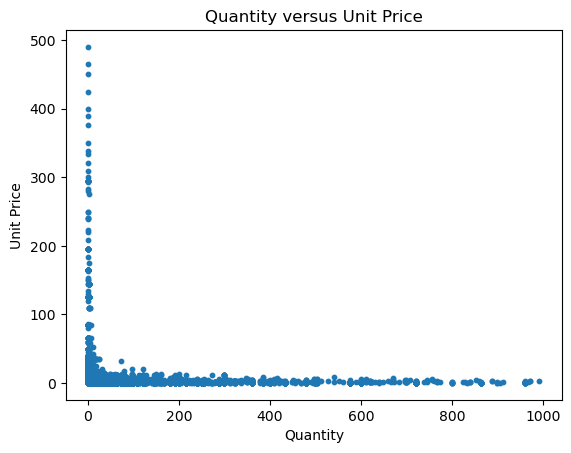

In [23]:
# scatterplot of Quantity versus UnitPrice
plt.scatter(df1['Quantity'], df1['UnitPrice'], s = 10)
plt.xlabel('Quantity')
plt.ylabel('Unit Price')
plt.title('Quantity versus Unit Price')
# plt.savefig("scatter.png")
plt.show()

Dichotomy between two extremes- in general, higher unit prices yield fewer quantities purchased and lower unit prices yield larger quantity purchased. Mathematically, appears to be an exponential function. 

### K Means Clustering on Numeric Values Present in Data

#### Standardizing Features

In [24]:
# scale data using StandardScaler
features = df1[['Quantity', 'UnitPrice']]
scaler = StandardScaler().fit(features.values)
features = scaler.transform(features.values)
scaled_features = pd.DataFrame(features, columns = ['Quantity', 'UnitPrice'])

#### Elbow Method for Number of Clusters

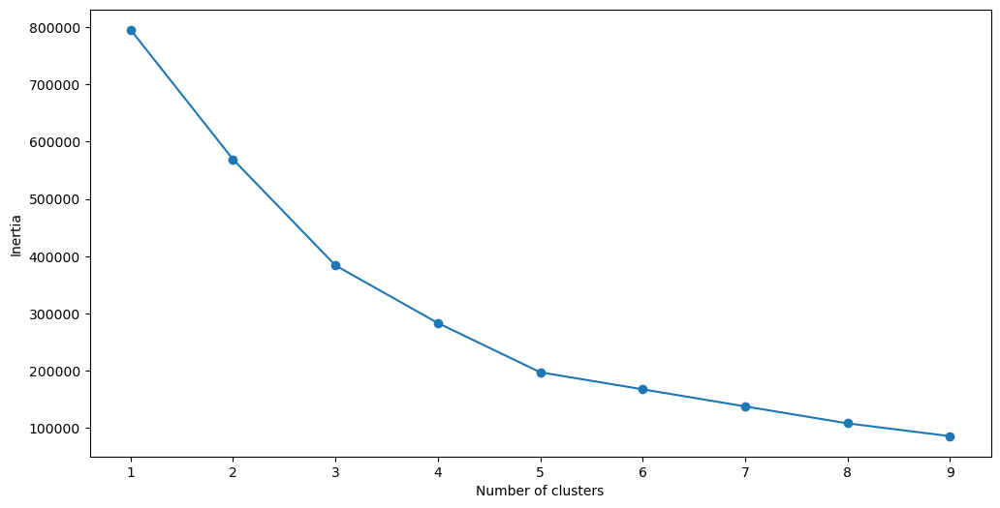

In [25]:
# training kmeans models with different k values
SSE = []
for cluster in range(1,10):
    kmeans = KMeans(n_clusters = cluster, init='k-means++')
    kmeans.fit(scaled_features)
    SSE.append(kmeans.inertia_)

# put results into dataframe and plot
frame = pd.DataFrame({'Cluster':range(1,10), 'SSE':SSE})
plt.figure(figsize=(12,6))
plt.plot(frame['Cluster'], frame['SSE'], marker='o')
plt.xlabel('Number of clusters')
plt.ylabel('Inertia')
# plt.savefig("elbow-nativevaronly.png")
plt.show()

Elbow appears around k=5 clusters

#### KMeans Model with k=5

In [26]:
# retrain model with k set to 5
kmeans = KMeans(n_clusters = 5, init='k-means++')
kmeans.fit(scaled_features)

KMeans(n_clusters=5)

In [27]:
# silhouette score
print(silhouette_score(scaled_features, kmeans.labels_, metric='euclidean'))

0.64669374408792


#### Assign Clusters to Values and Plot

In [28]:
# assign clusters to values
pred = kmeans.predict(scaled_features)
df2 = df1[['Quantity', 'UnitPrice']]
df2['Cluster'] = pred

/var/folders/dy/gv7q0xmn72x2t70qkbsbqtgc0000gp/T/ipykernel_29753/3712507072.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df2['Cluster'] = pred


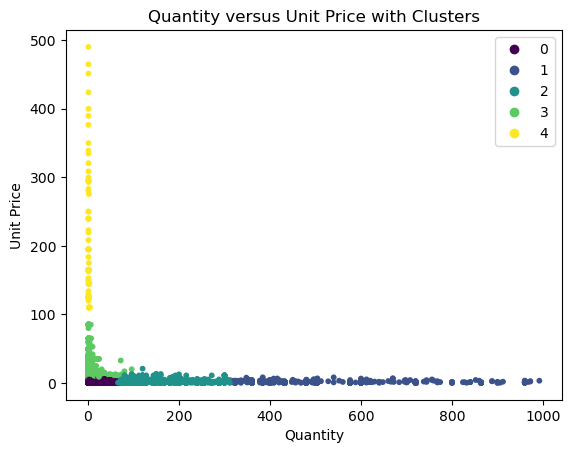

In [29]:
# plot Quantity and UnitPrice, with cluster labels
scatter = plt.scatter(df2['Quantity'], df2['UnitPrice'], s = 10, c = df2['Cluster'])
plt.xlabel('Quantity')
plt.ylabel('Unit Price')
plt.title('Quantity versus Unit Price with Clusters')
plt.legend(*scatter.legend_elements())
# plt.savefig("scatter-nativevaronly.png")
plt.show()

#### Transaction Traits by Cluster

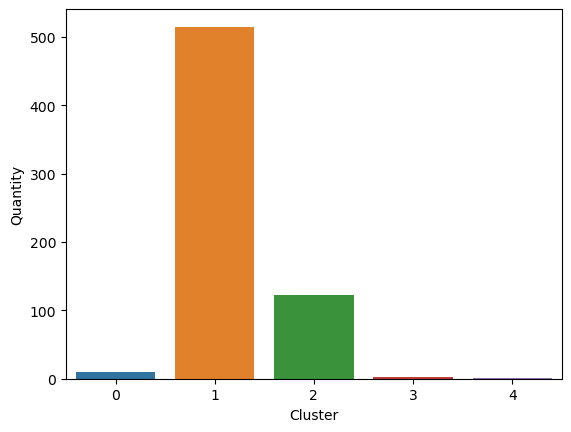

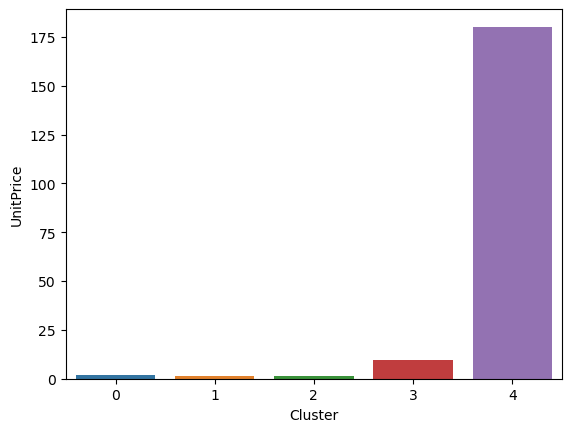

In [30]:
two_var = ['Quantity', 'UnitPrice']
avg_df = df2.groupby(['Cluster'], as_index=False).mean()
for i in two_var:
    sns.barplot(x='Cluster',y=str(i),data=avg_df)
    # plt.savefig("barplot-native{}.png".format(i))
    plt.show()

This model looks at types of transactions on the site, not types of customers. 

### K Means Clustering with Feature Engineering Based on RFM principles
Recency, Frequency, Monetary value per customer.

#### Recency

In [31]:
# sort each customer's purchases InvoiceDate by most to least recent
df1['PurchaseRank'] = df1.sort_values(['CustomerID','InvoiceDate']).groupby(['CustomerID'])['InvoiceDate'].rank(method='min').astype(int)
# keep only most recent date of purchase
df_rec = df1[df1['PurchaseRank']==1]

In [32]:
# recency score for each customer that compares most recent purchases between each CustomerID
df_rec['Recency'] = (df_rec['InvoiceDate'] - pd.to_datetime(min(df_rec['InvoiceDate']))).dt.days

/var/folders/dy/gv7q0xmn72x2t70qkbsbqtgc0000gp/T/ipykernel_29753/4166911017.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_rec['Recency'] = (df_rec['InvoiceDate'] - pd.to_datetime(min(df_rec['InvoiceDate']))).dt.days


#### Frequency

In [33]:
# counts number of transactions for each customer
freq = df_rec.groupby('CustomerID')['InvoiceDate'].count()
# creates frequency dataframe with frequency score and CustomerID
df_freq = pd.DataFrame(freq).reset_index()
df_freq.columns = ['CustomerID','Frequency']

#### Monetary Value

In [34]:
# multiply UnitPrice and Quantity
df1['Total'] = df1['Quantity'] * df1['UnitPrice']
# group by CustomerID to get sum of Total for each customer
df_m = df1.groupby('CustomerID')['Total'].sum()
# creates dataframe with total monetary value for CustomerID
df_m = pd.DataFrame(df_m).reset_index()
df_m.columns = ['CustomerID', 'MonetaryValue']

#### Merge Recency, Frequency, and MOnetary Value dataframes on CustomerID

In [35]:
# dataframe with just recency score and CustomerID
df_rec = df_rec[['CustomerID', 'Recency']]

In [36]:
# merge frequency and recency dataframe
rf = df_freq.merge(df_rec, on='CustomerID')
# merge monetary value dataframe to rfm dataframe
rfm = df_m.merge(rf, on='CustomerID')

In [37]:
# display first 5 rows of rfm dataframe
rfm.head()

,CustomerID,MonetaryValue,Frequency,Recency
0,12347.0,4310.0,31,6
1,12347.0,4310.0,31,6
2,12347.0,4310.0,31,6
3,12347.0,4310.0,31,6
4,12347.0,4310.0,31,6


#### Standardize Data

In [38]:
# create column names (3 engineered features)
col_names = ['Recency', 'Frequency', 'MonetaryValue']
features = rfm[col_names]
# scale data using StandardScaler
scaler = StandardScaler().fit(features.values)
features = scaler.transform(features.values)
scaled_features = pd.DataFrame(features, columns = col_names)

#### Elbow Method for Number of Clusters

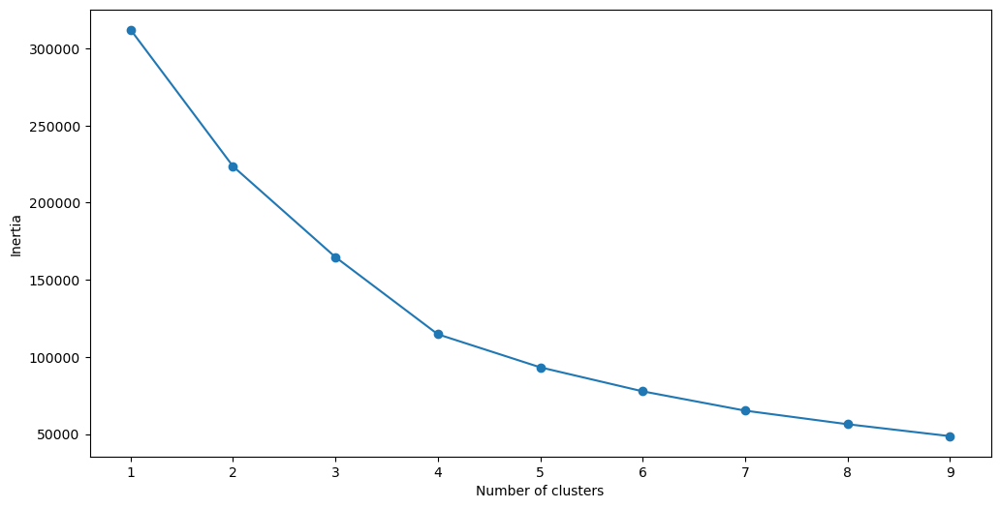

In [39]:
# training kmeans models with different k values
SSE = []
for cluster in range(1,10):
    kmeans = KMeans(n_clusters = cluster, init='k-means++')
    kmeans.fit(scaled_features)
    SSE.append(kmeans.inertia_)

# put results into dataframe and plot
frame = pd.DataFrame({'Cluster':range(1,10), 'SSE':SSE})
plt.figure(figsize=(12,6))
plt.plot(frame['Cluster'], frame['SSE'], marker='o')
plt.xlabel('Number of clusters')
plt.ylabel('Inertia')
# plt.savefig("elbow-featureengineer.png")
plt.show()

Elbow appears to be at k=4 clusters.

#### Kmeans model with k=4

In [40]:
# retrain kmeans model with k set to 4
kmeans = KMeans(n_clusters = 4, init='k-means++')
kmeans.fit(scaled_features)

KMeans(n_clusters=4)

In [41]:
# silhouette score
print(silhouette_score(scaled_features, kmeans.labels_, metric='euclidean'))

0.45646451184093306


#### Assign Clusters to Values and Plot

In [42]:
# assign clusters to values
pred = kmeans.predict(scaled_features)
rfm['Cluster'] = pred

In [43]:
# create 3D scatter from RFM data
figure = px.scatter_3d(rfm,
                    color='Cluster',
                    x="Recency",
                    y="Frequency",
                    z="MonetaryValue",
                    category_orders = {"Cluster": ["0", "1", "2", "3"]}
                    )
figure.update_layout()
figure.show()

#### Customer Traits by Cluster

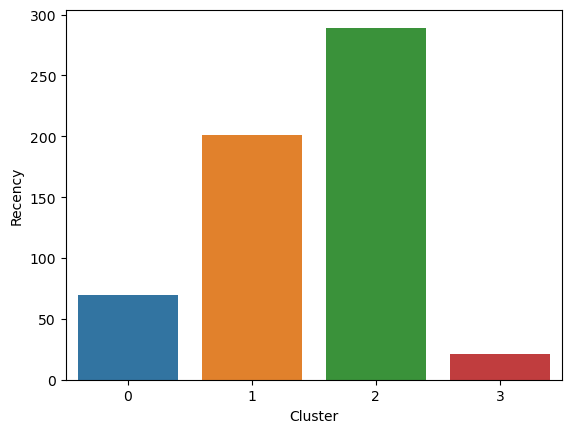

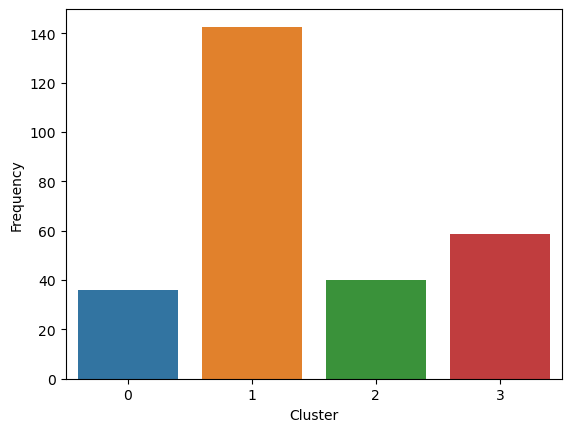

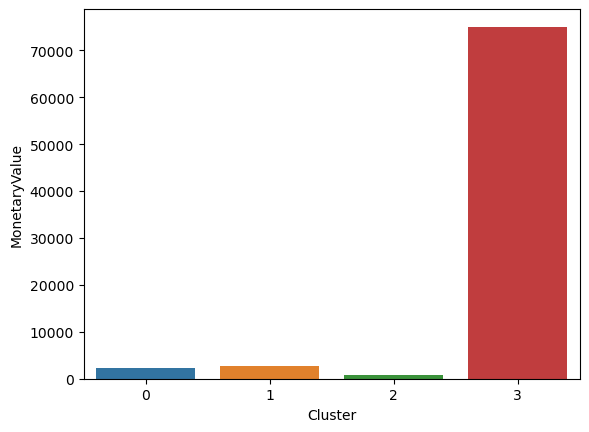

In [44]:
three_var = ['Recency','Frequency','MonetaryValue']
avg_df = rfm.groupby(['Cluster'], as_index=False).mean()
for i in three_var:
    sns.barplot(x='Cluster',y=str(i),data=avg_df)
    # plt.savefig("barplot-engineer{}.png".format(i))
    plt.show()

This model looks at different types of customers within dataset, divides customers into one of four achetypes, represented by the 4 clusters. 

### Wordclouds

#### Wordcloud for all Descriptions

In [45]:
# create text
text = " ".join(review for review in df1.Description)
# number of words in text
print ("There are {} words in the combination of all descriptions.".format(len(text)))

There are 11008827 words in the combination of all descriptions.


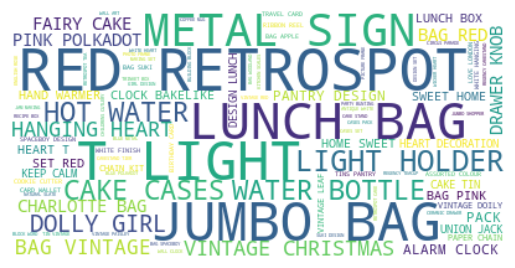

In [46]:
# set stop words
stopwords = set(STOPWORDS)

# generate word cloud image
wordcloud_all = WordCloud(stopwords=stopwords, background_color="white").generate(text)
plt.imshow(wordcloud_all, interpolation='bilinear')
plt.axis("off")
# plt.savefig('wordcloud_all.png')
plt.show()

#### Wordclouds for top 5 countries by number of transactions

In [47]:
# text for UK Descriptions
uk = " ".join(review for review in df1[df1["Country"]=='United Kingdom'].Description)
# number of words in UK text
print ("There are {} words in United Kingdom descriptions.".format(len(uk)))

# text for Germany Descriptions
germany = " ".join(review for review in df1[df1["Country"]=='Germany'].Description)
# number of words in Germany text
print ("There are {} words in Germany descriptions.".format(len(germany)))

# text for France Descriptions
france = " ".join(review for review in df1[df1["Country"]=='France'].Description)
# number of words in France text
print ("There are {} words in France descriptions.".format(len(france)))

# text for EIRE Descriptions
eire = " ".join(review for review in df1[df1["Country"]=='EIRE'].Description)
# number of words in EIRE text
print ("There are {} words in EIRE descriptions.".format(len(eire)))

# text for Spain Descriptions
spain = " ".join(review for review in df1[df1["Country"]=='Spain'].Description)
# number of words in Spain text
print ("There are {} words in Spain descriptions.".format(len(spain)))

There are 9829918 words in United Kingdom descriptions.
There are 241455 words in Germany descriptions.
There are 223022 words in France descriptions.
There are 199586 words in EIRE descriptions.
There are 68089 words in Spain descriptions.


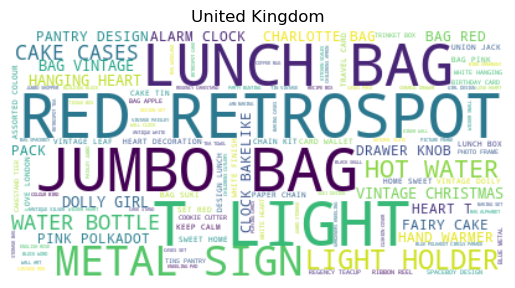

In [48]:
# generate United Kingdom word cloud image
wordcloud_uk = WordCloud(stopwords=stopwords, background_color="white").generate(uk)
plt.imshow(wordcloud_uk, interpolation='bilinear')
plt.axis("off")
plt.title("United Kingdom")
# plt.savefig('wordcloud_uk.png')
plt.show()

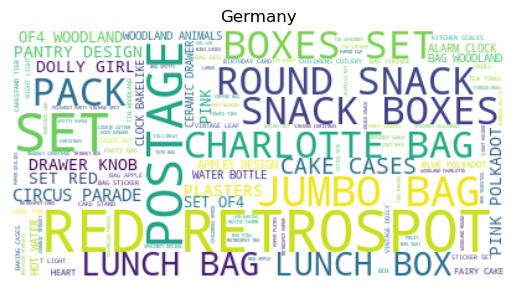

In [49]:
# generate Germany word cloud image
wordcloud_germany = WordCloud(stopwords=stopwords, background_color="white").generate(germany)
plt.imshow(wordcloud_germany, interpolation='bilinear')
plt.axis("off")
plt.title("Germany")
# plt.savefig('wordcloud_germany.png')
plt.show()

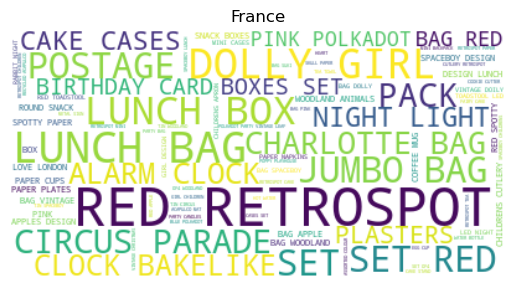

In [50]:
# generate France word cloud image
wordcloud_france = WordCloud(stopwords=stopwords, background_color="white").generate(france)
plt.imshow(wordcloud_france, interpolation='bilinear')
plt.axis("off")
plt.title("France")
# plt.savefig('wordcloud_france.png')
plt.show()

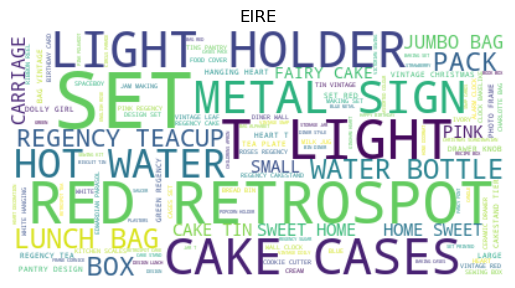

In [51]:
# generate EIRE word cloud image
wordcloud_eire = WordCloud(stopwords=stopwords, background_color="white").generate(eire)
plt.imshow(wordcloud_eire, interpolation='bilinear')
plt.axis("off")
plt.title("EIRE")
# plt.savefig('wordcloud_eire.png')
plt.show()

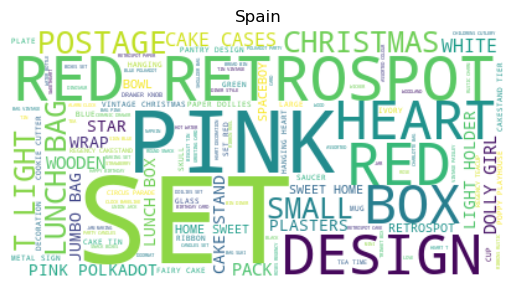

In [52]:
# generate Spain word cloud image
wordcloud_spain = WordCloud(stopwords=stopwords, background_color="white").generate(spain)
plt.imshow(wordcloud_spain, interpolation='bilinear')
plt.axis("off")
plt.title("Spain")
# plt.savefig('wordcloud_spain.png')
plt.show()

#### Wordclouds for other countries that are above the average number of transactions/customer

In [53]:
# text for Singapore Descriptions
singapore = " ".join(review for review in df1[df1["Country"]=='Singapore'].Description)
# number of words in Singapore text
print ("There are {} words in Singapore descriptions.".format(len(singapore)))

# text for Australia Descriptions
australia = " ".join(review for review in df1[df1["Country"]=='Australia'].Description)
# number of words in Australia text
print ("There are {} words in Australia descriptions.".format(len(australia)))

# text for Netherlands Descriptions
netherlands = " ".join(review for review in df1[df1["Country"]=='Netherlands'].Description)
# number of words in Netherlands text
print ("There are {} words in Netherlands descriptions.".format(len(netherlands)))

# text for Norway Descriptions
norway = " ".join(review for review in df1[df1["Country"]=='Norway'].Description)
# number of words in Norway text
print ("There are {} words in Norway descriptions.".format(len(norway)))

# text for Iceland Descriptions
iceland = " ".join(review for review in df1[df1["Country"]=='Iceland'].Description)
# number of words in Iceland text
print ("There are {} words in Iceland descriptions.".format(len(iceland)))

There are 6039 words in Singapore descriptions.
There are 31962 words in Australia descriptions.
There are 64249 words in Netherlands descriptions.
There are 29422 words in Norway descriptions.
There are 5213 words in Iceland descriptions.


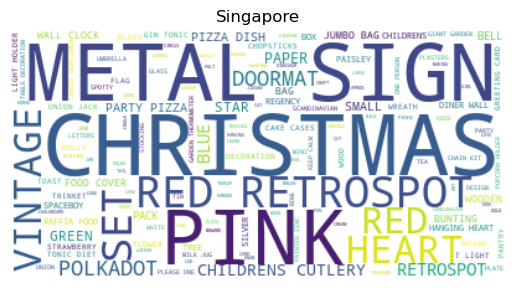

In [54]:
# generate Singapore word cloud image
wordcloud_singapore = WordCloud(stopwords=stopwords, background_color="white").generate(singapore)
plt.imshow(wordcloud_singapore, interpolation='bilinear')
plt.axis("off")
plt.title("Singapore")
# plt.savefig('wordcloud_singapore.png')
plt.show()

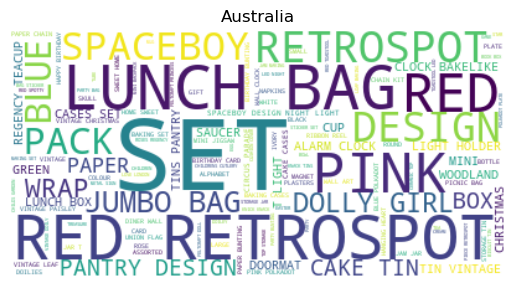

In [55]:
# generate Australia word cloud image
wordcloud_australia = WordCloud(stopwords=stopwords, background_color="white").generate(australia)
plt.imshow(wordcloud_australia, interpolation='bilinear')
plt.axis("off")
plt.title("Australia")
# plt.savefig('wordcloud_australia.png')
plt.show()

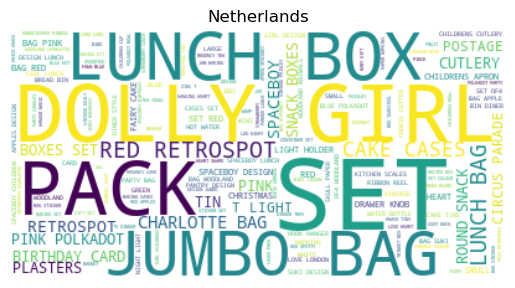

In [56]:
# generate Netherlands word cloud image
wordcloud_netherlands = WordCloud(stopwords=stopwords, background_color="white").generate(netherlands)
plt.imshow(wordcloud_netherlands, interpolation='bilinear')
plt.axis("off")
plt.title("Netherlands")
# plt.savefig('wordcloud_netherlands.png')
plt.show()

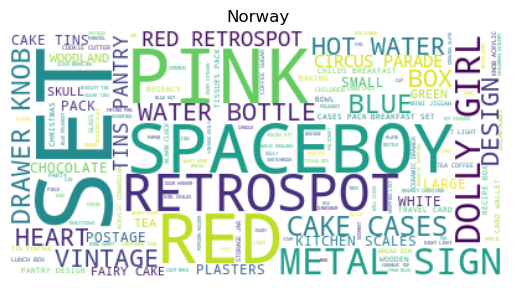

In [57]:
# generate Norway word cloud image
wordcloud_norway = WordCloud(stopwords=stopwords, background_color="white").generate(norway)
plt.imshow(wordcloud_norway, interpolation='bilinear')
plt.axis("off")
plt.title("Norway")
# plt.savefig('wordcloud_norway.png')
plt.show()

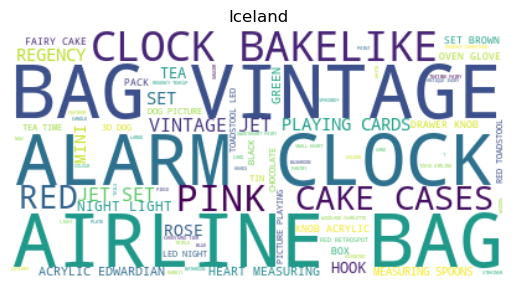

In [58]:
# generate Iceland word cloud image
wordcloud_iceland = WordCloud(stopwords=stopwords, background_color="white").generate(iceland)
plt.imshow(wordcloud_iceland, interpolation='bilinear')
plt.axis("off")
plt.title("Iceland")
# plt.savefig('wordcloud_iceland.png')
plt.show()